In [100]:
import pandas as pd
import numpy as np
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from wordcloud import WordCloud
import matplotlib.pyplot as plt

import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from gensim import corpora
from gensim.models import LdaModel

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering

In [101]:
data = pd.read_csv('bbc-news-data.csv', sep='\t')
data.sample(5)

,category,filename,title,content
143,business,144.txt,Oil prices fall back from highs,Oil prices retreated from four-month highs in...
401,business,402.txt,US interest rate rise expected,US interest rates are expected to rise for th...
2002,tech,179.txt,Seamen sail into biometric future,"The luxury cruise liner Crystal Harmony, curr..."
2161,tech,338.txt,Looks and music to drive mobiles,Mobile phones are still enjoying a boom time ...
353,business,354.txt,Asia shares defy post-quake gloom,Thailand has become the first of the 10 south...


In [102]:
data.columns

Index(['category', 'filename', 'title', 'content'], dtype='object')

 ### Предобработка текста

    Объединение заголовка и содержания статьи в одно поле.
    Приведение текста к нижнему регистру.
    Разбиение текста на токены.
    Удаление чисел и пунктуации.
    Лемматизация.
    Удаление стоп-слов.

In [103]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

stop_words = set(stopwords.words('english') + ['ha', 'wa', 'say', 'said', 'one', 'u', 'people', 'mr', 'first', 'way', 'also'])
lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Redmi\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Redmi\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Redmi\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [104]:
def preprocess(text):
    text = list(filter(str.isalpha, word_tokenize(text.lower())))
    text = list(lemmatizer.lemmatize(word) for word in text)
    text = list(word for word in text if word not in stop_words)
    return ' '.join(text)

In [105]:
data['raw_text'] = data.apply(lambda row: row.title + row.content, axis=1)
data['text'] = data.apply(lambda row: preprocess(row.raw_text), axis=1)


Для визуализации частот слов в текстах используем облака тегов.

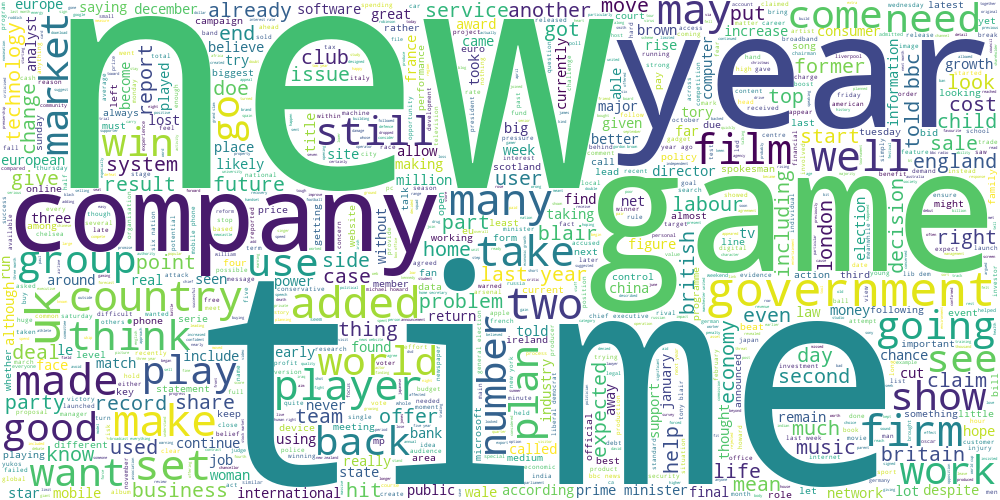

In [106]:
from wordcloud import WordCloud

def draw_wordcloud(texts, max_words=1000, width=1000, height=500):
    wordcloud = WordCloud(background_color='white', max_words=max_words,
                          width=width, height=height)

    joint_texts = ' '.join(list(texts))
    wordcloud.generate(joint_texts)
    return wordcloud.to_image()

draw_wordcloud(data.text)

### **Задание 1.1**

Обучите алгоритм K-Means на tf-idf представлениях текстов. При обучении tf-idf векторайзера рекомендуется отбрасывать редко встречающиеся слова и использовать не очень большое число кластеров, чтобы было удобно интерпретировать получившиеся темы (например, n_clusters = 8).
Постройте облака тегов для текстов из разных кластеров и попробуйте озаглавить каждую тему.

**TF-IDF** (от англ. TF — term frequency, IDF — inverse document frequency) — статистическая мера, используемая для оценки важности слова в контексте документа, являющегося частью коллекции документов или корпуса.<br/>
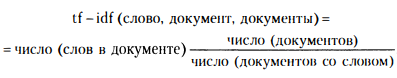

В результате высокие значения получают относительно редкие слова.

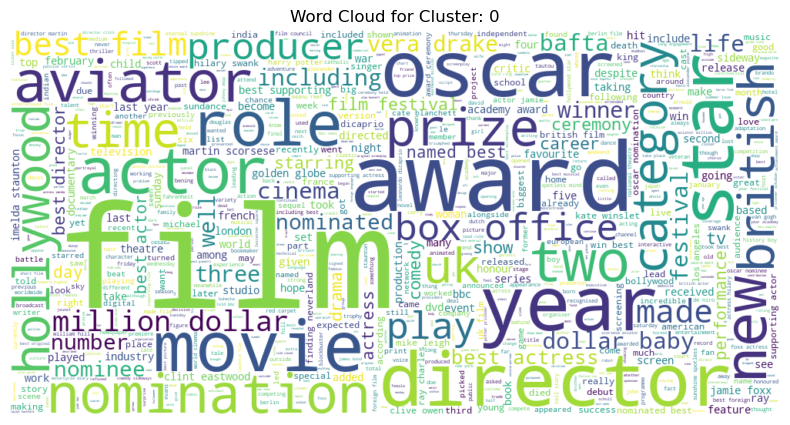

Top words for Cluster 0:
[('film', 842), ('best', 368), ('award', 324), ('year', 202), ('actor', 195), ('director', 186), ('oscar', 179), ('star', 150), ('actress', 135), ('festival', 113)]


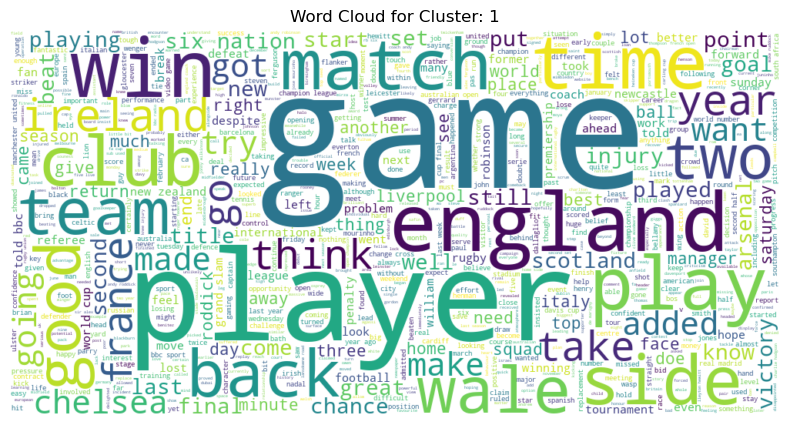

Top words for Cluster 1:
[('game', 1001), ('player', 514), ('england', 459), ('win', 411), ('year', 391), ('time', 382), ('would', 362), ('play', 352), ('two', 334), ('last', 330)]


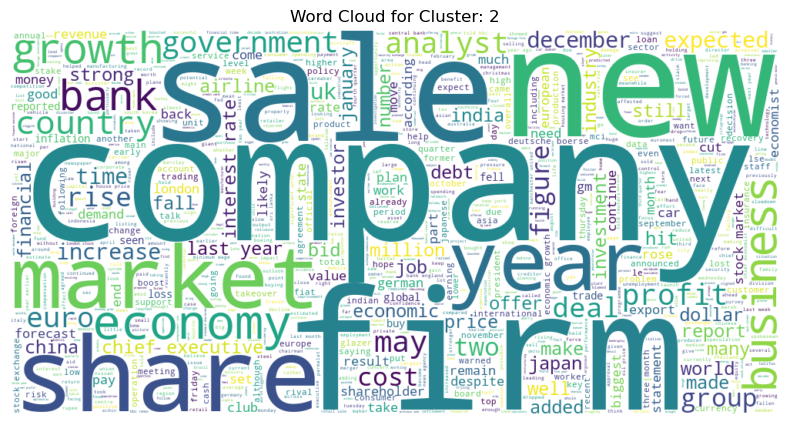

Top words for Cluster 2:
[('year', 657), ('market', 441), ('company', 423), ('firm', 390), ('sale', 365), ('bank', 353), ('share', 337), ('growth', 333), ('new', 315), ('would', 312)]


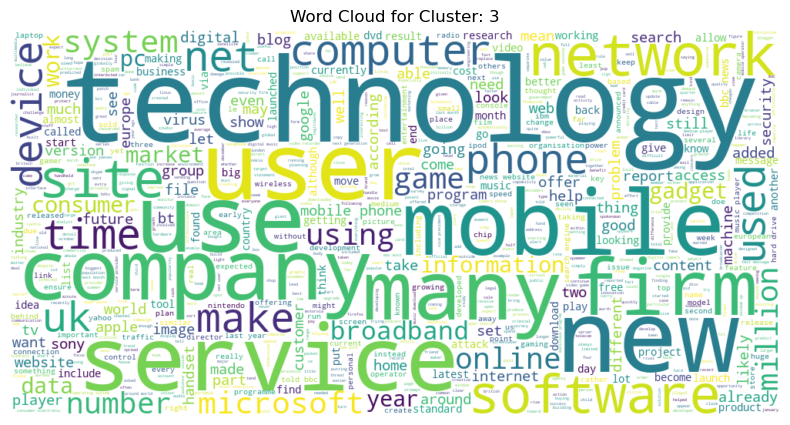

Top words for Cluster 3:
[('technology', 598), ('mobile', 593), ('phone', 555), ('service', 509), ('user', 456), ('new', 456), ('would', 427), ('year', 406), ('could', 406), ('firm', 377)]


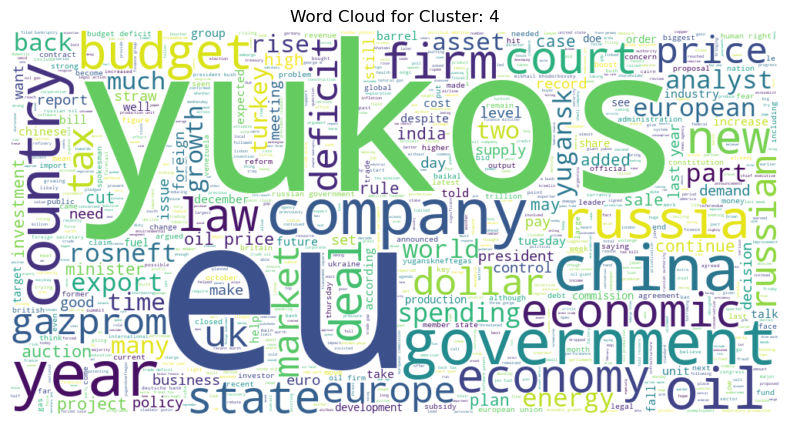

Top words for Cluster 4:
[('oil', 252), ('eu', 209), ('yukos', 196), ('year', 188), ('would', 173), ('company', 147), ('government', 142), ('tax', 136), ('china', 127), ('price', 122)]


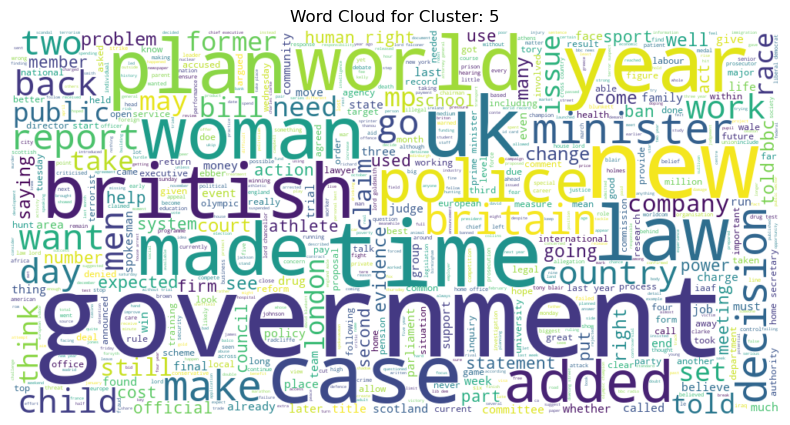

Top words for Cluster 5:
[('would', 565), ('government', 449), ('year', 437), ('new', 339), ('could', 296), ('lord', 281), ('world', 275), ('minister', 251), ('told', 242), ('time', 242)]


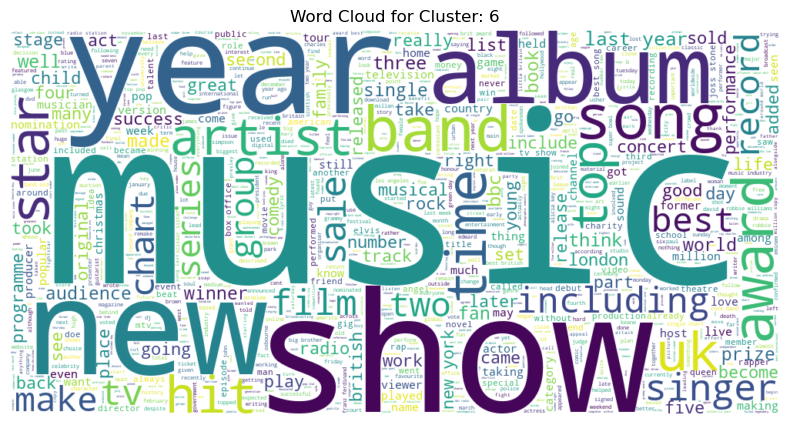

Top words for Cluster 6:
[('music', 450), ('year', 380), ('show', 366), ('new', 240), ('band', 238), ('best', 236), ('song', 230), ('album', 215), ('award', 207), ('number', 183)]


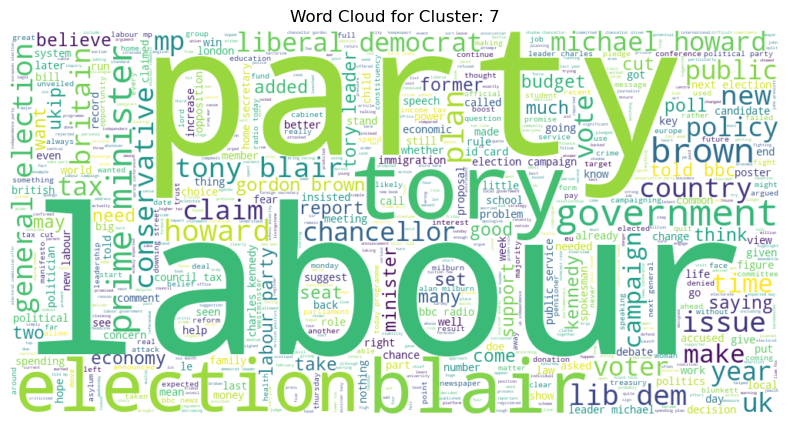

Top words for Cluster 7:
[('labour', 692), ('party', 631), ('election', 608), ('would', 597), ('blair', 465), ('tory', 429), ('brown', 336), ('tax', 329), ('government', 324), ('minister', 317)]


In [107]:

tfidf_vectorizer = TfidfVectorizer(max_features=1000)  # Ограничиваем число признаков
tfidf_matrix = tfidf_vectorizer.fit_transform(data['text'])

num_clusters = 8
kmeans_model = KMeans(n_clusters=num_clusters, random_state=42)
kmeans_model.fit(tfidf_matrix)

# Получение меток кластеров
data['kmeans_cluster'] = kmeans_model.labels_

# Функция для создания облака тегов
def generate_wordcloud(text_data, max_words=1000, img_width=1000, img_height=500):
    wordcloud = WordCloud(background_color='white', max_words=max_words,
                          width=img_width, height=img_height)
    combined_text = ' '.join(text_data)
    wordcloud.generate(combined_text)
    return wordcloud.to_image()

# Построение облаков тегов для каждого кластера
for cluster_id in range(num_clusters):
    plt.figure(figsize=(10, 5))
    cluster_text_data = data[data['kmeans_cluster'] == cluster_id]['text']
    wordcloud_image = generate_wordcloud(cluster_text_data)
    plt.imshow(wordcloud_image, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for Cluster: {cluster_id}') 
    plt.show()

    print(f'Top words for Cluster {cluster_id}:')
    cluster_texts = ' '.join(cluster_text_data)
    tokens = word_tokenize(cluster_texts)
    frequency_distribution = nltk.FreqDist(tokens)
    top_words_list = frequency_distribution.most_common(10)  # 10 самых частых слов
    print(top_words_list)


In [108]:
clusters = [
    "Cinema Highlights", 
    "Gaming Universe", 
    "Financial Insights", 
    "Technology", 
    "Energy Sector Trends", 
    "Government Affairs", 
    "Music", 
    "Political Strategies"
]

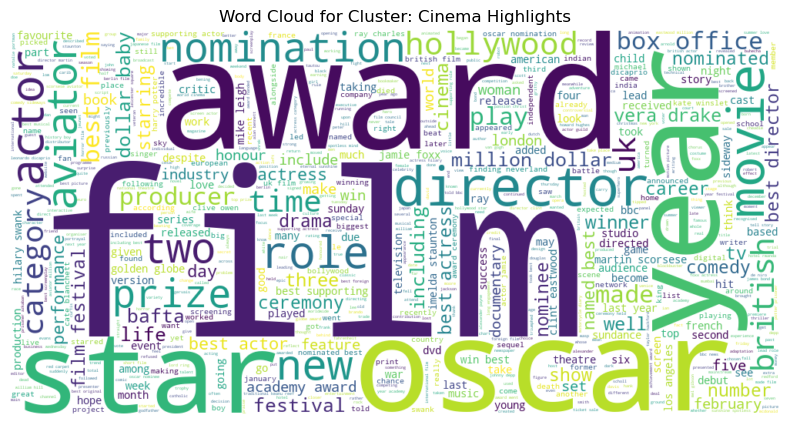

Top words for Cluster: Cinema Highlights
[('film', 842), ('best', 368), ('award', 324), ('year', 202), ('actor', 195), ('director', 186), ('oscar', 179), ('star', 150), ('actress', 135), ('festival', 113)]


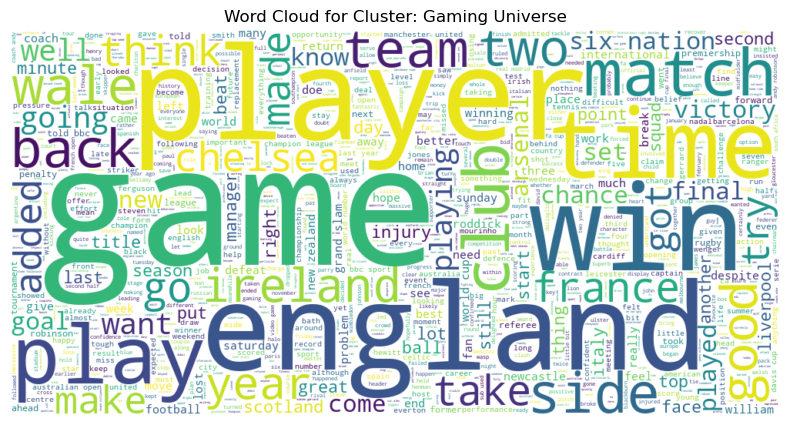

Top words for Cluster: Gaming Universe
[('game', 1001), ('player', 514), ('england', 459), ('win', 411), ('year', 391), ('time', 382), ('would', 362), ('play', 352), ('two', 334), ('last', 330)]


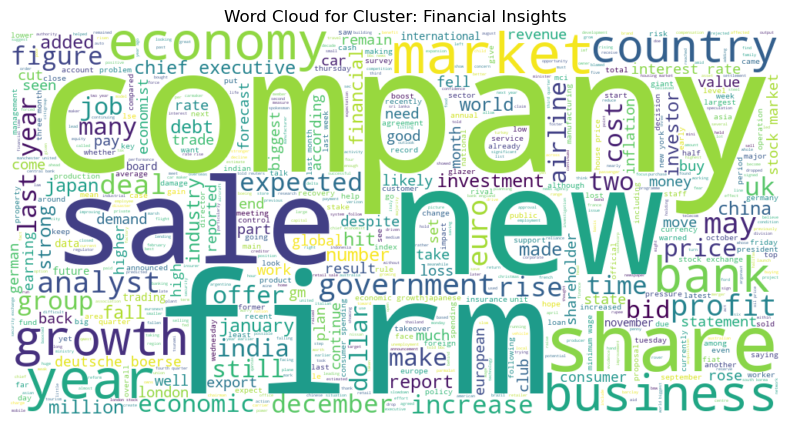

Top words for Cluster: Financial Insights
[('year', 657), ('market', 441), ('company', 423), ('firm', 390), ('sale', 365), ('bank', 353), ('share', 337), ('growth', 333), ('new', 315), ('would', 312)]


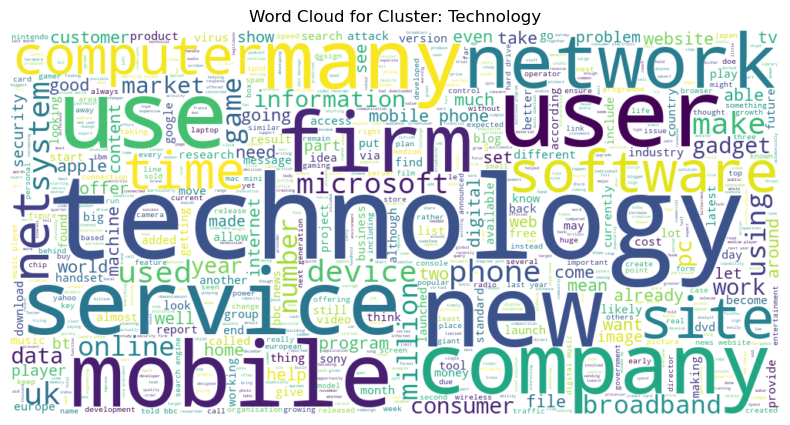

Top words for Cluster: Technology
[('technology', 598), ('mobile', 593), ('phone', 555), ('service', 509), ('user', 456), ('new', 456), ('would', 427), ('year', 406), ('could', 406), ('firm', 377)]


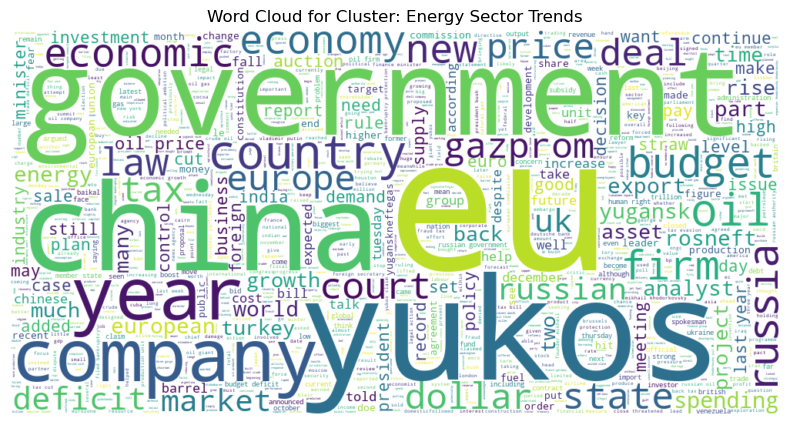

Top words for Cluster: Energy Sector Trends
[('oil', 252), ('eu', 209), ('yukos', 196), ('year', 188), ('would', 173), ('company', 147), ('government', 142), ('tax', 136), ('china', 127), ('price', 122)]


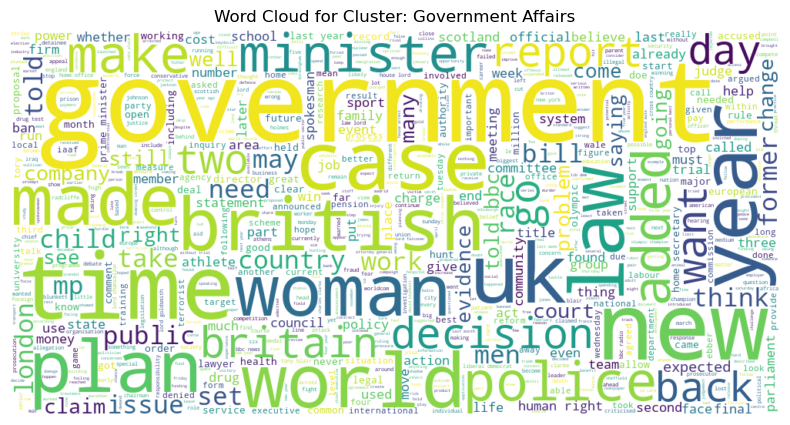

Top words for Cluster: Government Affairs
[('would', 565), ('government', 449), ('year', 437), ('new', 339), ('could', 296), ('lord', 281), ('world', 275), ('minister', 251), ('told', 242), ('time', 242)]


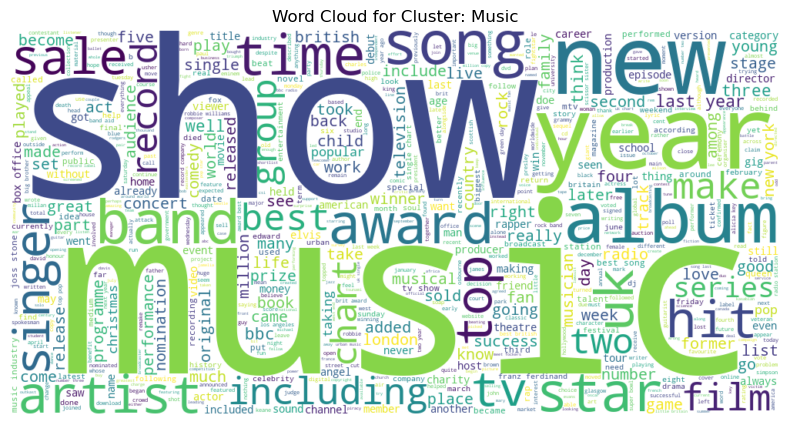

Top words for Cluster: Music
[('music', 450), ('year', 380), ('show', 366), ('new', 240), ('band', 238), ('best', 236), ('song', 230), ('album', 215), ('award', 207), ('number', 183)]


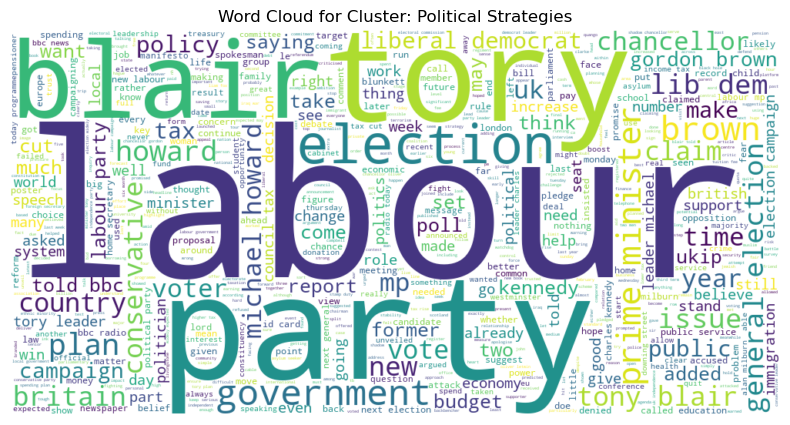

Top words for Cluster: Political Strategies
[('labour', 692), ('party', 631), ('election', 608), ('would', 597), ('blair', 465), ('tory', 429), ('brown', 336), ('tax', 329), ('government', 324), ('minister', 317)]


In [109]:
for cluster_id in range(num_clusters):
    plt.figure(figsize=(10, 5))
    cluster_text_data = data[data['kmeans_cluster'] == cluster_id]['text']
    wordcloud_image = generate_wordcloud(cluster_text_data)
    plt.imshow(wordcloud_image, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for Cluster: {clusters[cluster_id]}')  # Используем название кластера
    plt.show()

    print(f'Top words for Cluster: {clusters[cluster_id]}')  # Используем название кластера
    cluster_texts = ' '.join(cluster_text_data)
    tokens = word_tokenize(cluster_texts)
    frequency_distribution = nltk.FreqDist(tokens)
    top_words_list = frequency_distribution.most_common(10)  # 10 самых частых слов
    print(top_words_list)

### **Задание 1.2**

Помимо непосредственного разбиения объектов алгоритм K-Means получает центр каждого кластера. Попробуйте взять центры кластеров и посмотреть на слова, для которых значения соответствующих им признаков максимальны.
Проанализируйте, согласуются ли полученные слова с облаками тегов из прошлого задания.

In [110]:
kmeans_centers = kmeans_model.cluster_centers_

# Получаем слова из векторизатора
feature_list = tfidf_vectorizer.get_feature_names_out()

# Словарь для хранения слов с максимальными значениями для каждого кластера
keywords_per_cluster = {}

# Проход по каждому кластеру и извлечение наиболее значимых слов
for i, center in enumerate(kmeans_centers):
    top_indices = center.argsort()[-10:][::-1]  # 10 наиболее значительных слов
    top_keywords = [feature_list[index] for index in top_indices]
    keywords_per_cluster[i] = top_keywords

# Словарь для хранения наиболее частых слов для каждого кластера
frequent_keywords_per_cluster = {}

# Сравнение с полученными списками
for cluster_id in range(num_clusters):
    cluster_text_data = data[data['kmeans_cluster'] == cluster_id]['text']
    
    # Получение 10 самых частых слов
    combined_text = ' '.join(cluster_text_data)
    tokens = word_tokenize(combined_text)
    frequency_distribution = nltk.FreqDist(tokens)
    top_frequent_keywords = frequency_distribution.most_common(10)  # 10 самых частых слов
    frequent_keywords_per_cluster[cluster_id] = [word for word, _ in top_frequent_keywords]  # Сохраняем только слова

    # Выводим слова для каждого кластера
    print(f'Кластер {cluster_id}:')
    print(f'Наиболее значимые слова из центров K-Means: {", ".join(keywords_per_cluster[cluster_id])}')
    print(f'Наиболее частые слова: {", ".join(frequent_keywords_per_cluster[cluster_id])}')
    print('-' * 40)


Кластер 0:
Наиболее значимые слова из центров K-Means: film, award, best, oscar, actor, festival, actress, director, star, movie
Наиболее частые слова: film, best, award, year, actor, director, oscar, star, actress, festival
----------------------------------------
Кластер 1:
Наиболее значимые слова из центров K-Means: game, player, england, match, win, club, cup, play, injury, side
Наиболее частые слова: game, player, england, win, year, time, would, play, two, last
----------------------------------------
Кластер 2:
Наиболее значимые слова из центров K-Means: market, bank, share, company, firm, sale, growth, year, economy, profit
Наиболее частые слова: year, market, company, firm, sale, bank, share, growth, new, would
----------------------------------------
Кластер 3:
Наиболее значимые слова из центров K-Means: mobile, phone, technology, user, computer, service, software, net, digital, site
Наиболее частые слова: technology, mobile, phone, service, user, new, would, year, could, fir

### **Задание 2**

Проведите моделирование с помощью другого алгоритма кластеризации, также используя tf-idf в в качестве признакого описания.<br/>
Сравните получившиеся результаты.

In [111]:
X_dense = tfidf_matrix.toarray()

scaler = StandardScaler(with_mean=False)
X_scaled = scaler.fit_transform(X_dense)

# Моделирование с помощью иерархической кластеризации (Agglomerative Clustering)
n_clusters = 7
agglo_clustering = AgglomerativeClustering(n_clusters=n_clusters)
data['agglo_clusters'] = agglo_clustering.fit_predict(X_scaled)

Кластер 0: game, year, player, win, england, would, time, world, last, two
Кластер 1: game, mobile, phone, technology, service, new, year, user, would, could
Кластер 2: film, best, year, award, show, new, music, star, tv, uk
Кластер 3: year, company, would, firm, new, market, sale, government, country, could
Кластер 4: would, government, law, could, year, plan, new, minister, police, home
Кластер 5: rate, growth, economy, year, figure, price, month, market, rise, economic
Кластер 6: labour, party, election, would, blair, brown, tory, tax, government, minister


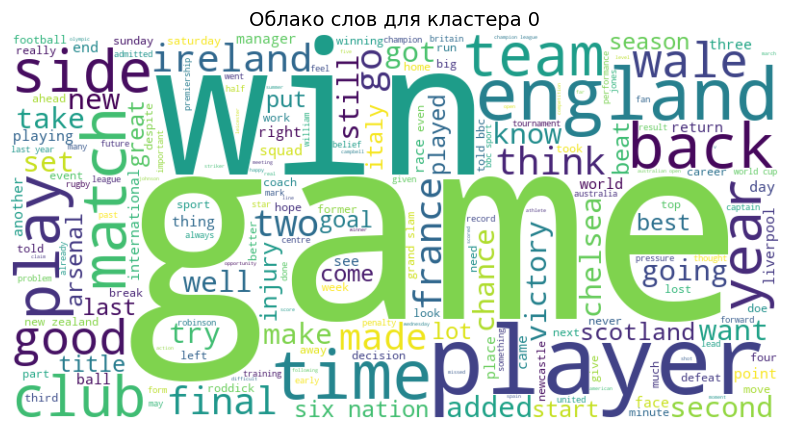

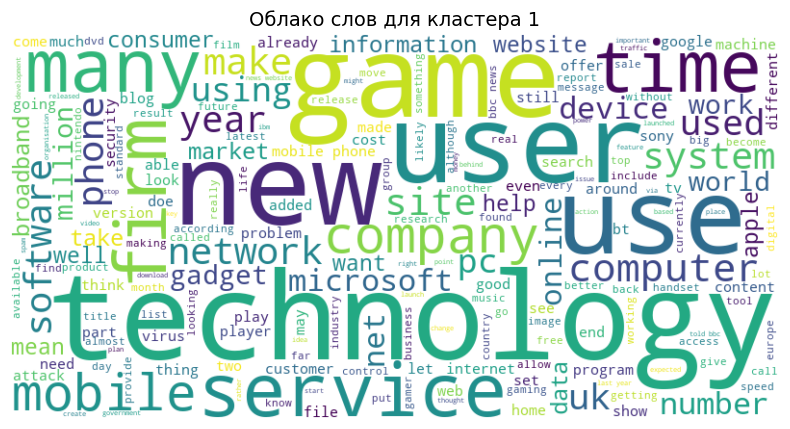

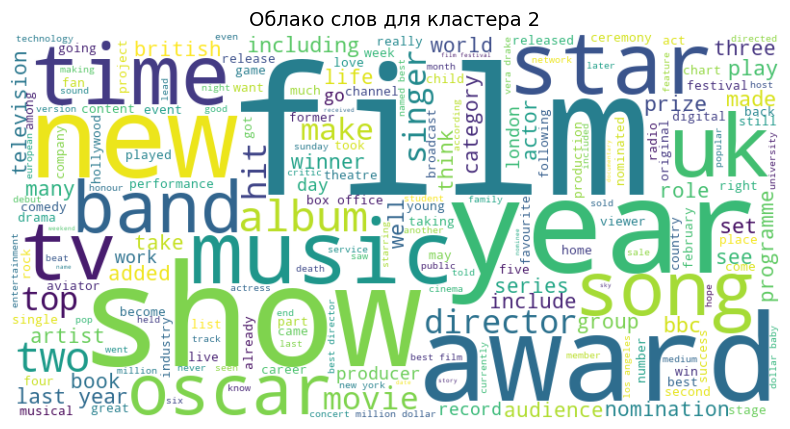

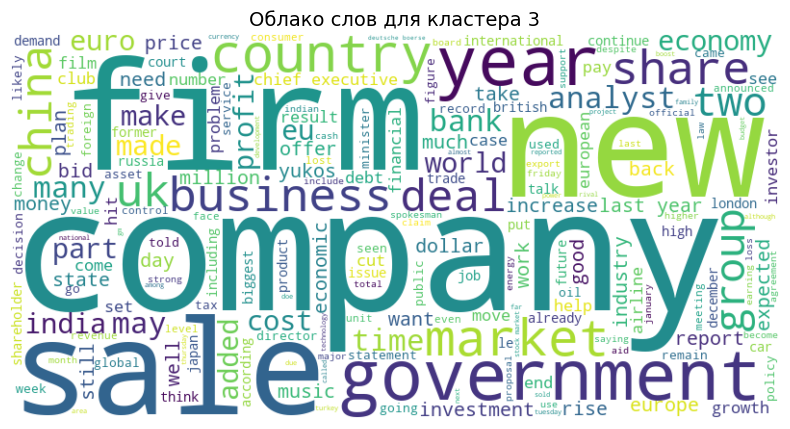

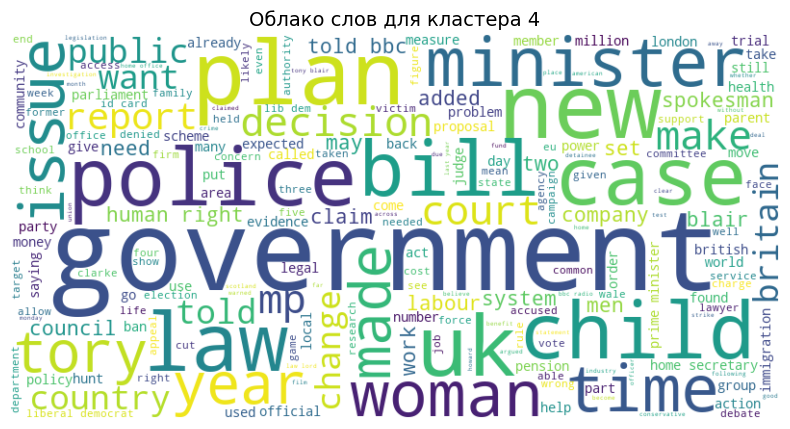

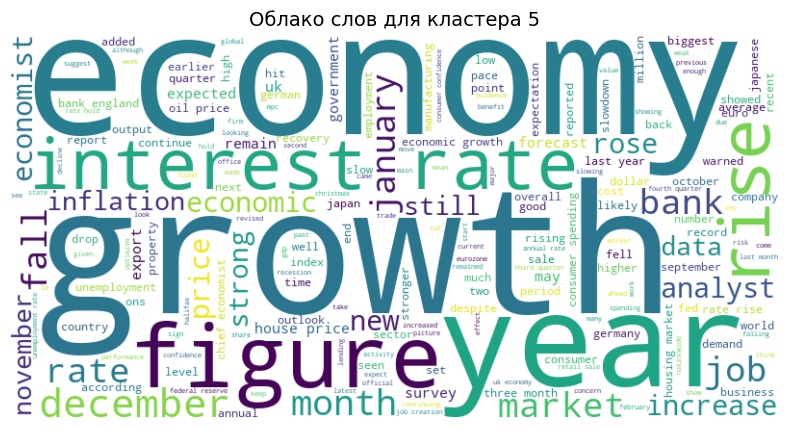

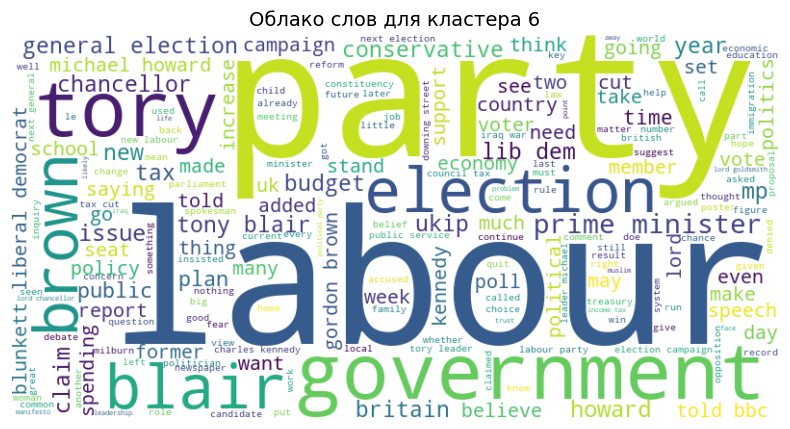

In [112]:
# Функция для вывода ключевых слов в каждом кластере
def top_words_by_cluster(df, text_column, cluster_column, n_words=10):
    for cluster in set(df[cluster_column]):
        cluster_text = ' '.join(df[df[cluster_column] == cluster][text_column])
        cluster_words = word_tokenize(cluster_text)
        freq_dist = nltk.FreqDist(cluster_words)
        top_words = freq_dist.most_common(n_words)
        print(f'Кластер {cluster}: {", ".join([word for word, _ in top_words])}')

# Вывод топовых слов для кластеров
top_words_by_cluster(data, 'text', 'agglo_clusters')

# Построение облаков слов для каждого кластера
def generate_wordcloud(text, cluster_number):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Облако слов для кластера {cluster_number}', fontsize=14)
    plt.show()

# Генерация облаков слов по каждому кластеру
for cluster in set(data['agglo_clusters']):
    cluster_texts = ' '.join(data[data['agglo_clusters'] == cluster]['text'])
    generate_wordcloud(cluster_texts, cluster)


### **Задание 3**

Обучите модель латентного раcпредения Дирихле. Обратите внимание, что она работает с мешком слов, а не с tf-idf признаками. Параметр n_components возьмите в 2-3 раза больше, чем число кластеров для K-Means. Постройте облака тегов для нескольких наиболее удачных тем.

**Скрытое распределение Дирихле** (LDA) - это форма неконтролируемого машинного обучения, которая обычно используется для тематического моделирования в задачах обработки естественного языка.<br/> LDA основан на предположении, что каждый документ может быть представлен как смесь различных тем, а каждая тема связана с распределением слов. Алгоритм итеративно обрабатывает тексты, чтобы определить, какие темы присутствуют в документах и какие слова связаны с каждой темой, при этом старается максимизировать вероятность появления слов в каждой теме и вероятность наличия тем в каждом документе.<br/>
Алгоритм состоит из нескольких шагов:<br/>
1. Инициализация параметров.<br/>
Задаем количество n тем, которые будут идентифицированы алгоритмом LDA. <br/>
2. Назначаем случайным образом каждое слово в каждом документе временной теме.<br/>
3. Проходимся по каждому документу, а затем по каждому слову в этом документе и вычисляем 2 значения:
* вероятность того, что этот документ относится к определенной теме, на основе того, сколько слов (кроме текущего слова) из этого документа относятся к теме текущего слова;
* долю документов, которые отнесены к теме текущего слова из-за текущего слова


Шаг 3 выполняется определенное количество раз (устанавливается перед запуском алгоритма). Затем рассматривается каждый документ, определяется наиболее распространенная тема на основе ее слов и каждому документу назначается соответствующая тема.

LDA может быть реализован с использованием библиотек [gensim](https://radimrehurek.com/gensim/index.html#) или scikit-learn ( [LatentDirichletAllocation](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.LatentDirichletAllocation.html)).

# Используем модель gensim

In [113]:
doc = data['text'].tolist()
dictionary = corpora.Dictionary([doc.split() for doc in doc])
corpus = [dictionary.doc2bow(doc.split()) for doc in doc]


In [114]:
n_topics = 8
lda_model = LdaModel(corpus, num_topics=n_topics, id2word=dictionary, passes=10, random_state=42)

In [115]:
for idx, topic in lda_model.print_topics(-1):
    print(f'Topic {idx}: {topic}')


Topic 0: 0.009*"company" + 0.009*"would" + 0.008*"could" + 0.008*"patent" + 0.007*"law" + 0.007*"software" + 0.006*"bill" + 0.006*"firm" + 0.006*"system" + 0.006*"government"
Topic 1: 0.015*"mobile" + 0.012*"phone" + 0.012*"tv" + 0.012*"digital" + 0.012*"technology" + 0.011*"music" + 0.008*"service" + 0.007*"device" + 0.007*"player" + 0.006*"video"
Topic 2: 0.012*"user" + 0.009*"net" + 0.009*"site" + 0.007*"firm" + 0.007*"service" + 0.007*"software" + 0.007*"computer" + 0.006*"pc" + 0.006*"search" + 0.006*"virus"
Topic 3: 0.007*"would" + 0.005*"year" + 0.004*"best" + 0.004*"time" + 0.004*"last" + 0.004*"new" + 0.004*"film" + 0.003*"labour" + 0.003*"party" + 0.003*"two"
Topic 4: 0.028*"mobile" + 0.025*"phone" + 0.010*"service" + 0.008*"number" + 0.007*"handset" + 0.007*"multimedia" + 0.007*"get" + 0.006*"message" + 0.006*"firm" + 0.005*"text"
Topic 5: 0.011*"technology" + 0.007*"could" + 0.006*"dvd" + 0.006*"would" + 0.006*"network" + 0.005*"firm" + 0.005*"company" + 0.005*"computer" + 

In [116]:
topic_assignments = [lda_model.get_document_topics(bow) for bow in corpus]

data['topic'] = [max(doc, key=lambda x: x[1])[0] for doc in topic_assignments]


In [117]:
import pandas as pd
from gensim import corpora
from gensim.models import LdaModel
from gensim.models.coherencemodel import CoherenceModel
# Оценка когерентности

coherence_model = CoherenceModel(model=lda_model, texts=[doc.split() for doc in doc], dictionary=dictionary, coherence='c_v')
coherence_score = coherence_model.get_coherence()

print(f'Когерентность темы: {coherence_score}')

Когерентность темы: 0.5087058878518094
